In [2]:
import numpy as np
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_probability as tfp
import tensorflow as tf

from data.dataset_of import read_dataset

import os

from tqdm import tqdm

from PIL import Image

from tensorflow.keras.layers import (Flatten, 
    Conv2D, Conv2DTranspose, Dropout, Conv1D, ConvLSTM1D, Reshape,
    BatchNormalization, Dense, Lambda, LSTM, Add,        
    Concatenate, AveragePooling2D, AveragePooling1D, GlobalMaxPooling2D,
    GlobalAveragePooling2D)
from tensorflow.keras import Model, Input

plt.gray()

2022-10-29 01:23:28.621073: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


<Figure size 432x288 with 0 Axes>

In [3]:
scale = 100

train_dataset, test_dataset, val_datasets = read_dataset(
    './data/sgf',
    slices_type = tf.uint8,
    im_width = 1024,
    im_height = 1024,
    seq_len = 1, 
    batch_size = 4,
    test_split = 0.2,
    val_core_list = [],
    seed = 1000,
    image_norm = 1.0,
    prefetch_num = tf.data.AUTOTUNE,
    window_shift = 1,
    window_stride = 1)

def sr_task(x):
    x = x / 255.0 - 0.5
    y = x
    #y = tf.tile(x, [1, 1, 1, 3])
    x = tf.image.resize(x, [1000 // scale, 1000 // scale], method='nearest')
    #x = tf.tile(x, [1, 1, 1, 3])
    return x,y

#train_dataset = train_dataset.map(lambda x: sr_task(x))
#test_dataset = test_dataset.map(lambda x: sr_task(x))
train_dataset = train_dataset.map(lambda x: x / 255.0)
test_dataset = test_dataset.map(lambda x: x / 255.0)

2022-10-29 01:23:31.304107: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-29 01:23:31.331810: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-29 01:23:31.331899: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-29 01:23:31.332803: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

(4, 1024, 1024, 1) <dtype: 'float32'> tf.Tensor(1.0, shape=(), dtype=float32) tf.Tensor(0.0, shape=(), dtype=float32)


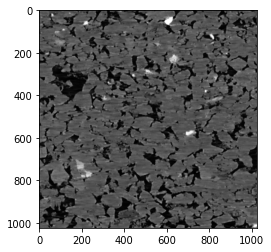

(1024, 1024, 1)


In [4]:
input_shape = None

for x in train_dataset.take(1):
    print(x.shape, x.dtype, tf.reduce_max(x), tf.reduce_min(x))
    input_shape = x[0].shape
    plt.imshow(x[0])
    plt.show()

print(input_shape)

In [5]:
#latent_dim =  256#@param {type: "number"}
dense_dim =  256#@param {type: "number"}
betta = 1 #@param {type: "number"}

In [15]:
def res_block(x_in, filters, scaling):
    x = Conv2D(filters, 3, padding='same', activation='relu')(x_in)
    x = Conv2D(filters, 3, padding='same')(x)
    if scaling:
        x = Lambda(lambda t: t * scaling)(x)
    x = Add()([x_in, x])
    return x

class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

encoder_inputs = keras.Input(shape=input_shape)
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(128, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(256, 3, activation="relu", strides=2, padding="same")(x)
last_conv_shape = x.shape
x = layers.Conv2D(512, 3, activation="relu", strides=2, padding="same")(x)
# x = layers.Conv2D(512, 3, activation="relu", strides=2, padding="same")(x)
#x = layers.Flatten()(x)
#x = layers.Flatten()(x)
#x = layers.Dense(dense_dim, activation="relu")(x)
z_mean = Lambda(lambda x: x[...,:256])(x)
z_mean = layers.Flatten()(z_mean)
z_log_var = Lambda(lambda x: x[...,256:])(x) #layers.Dense(latent_dim, name="z_log_var")(x)
z_log_var = layers.Flatten()(z_log_var)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

latent_inputs = keras.Input(shape=encoder.outputs[-1].shape[1:])

#print(encoder.outputs[-1].shape)

#x = layers.Dense((last_conv_shape[1]) * (last_conv_shape[2]) * last_conv_shape[3], activation="relu")(latent_inputs)
x = layers.Reshape([32, 32, 256])(latent_inputs)
x = layers.Conv2DTranspose(512, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(256, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(128, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2D(1, 3, activation="sigmoid", padding="same")(x)
decoder_outputs_fixed_size = layers.Lambda(lambda x: tf.image.resize(x, input_shape[:-1]))(decoder_outputs)
decoder = keras.Model(latent_inputs, decoder_outputs_fixed_size, name="decoder")
decoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(None, 1024, 1024,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv2d_48 (Conv2D)             (None, 512, 512, 32  320         ['input_18[0][0]']               
                                )                                                                 
                                                                                                  
 conv2d_49 (Conv2D)             (None, 256, 256, 64  18496       ['conv2d_48[0][0]']              
                                )                                                           

In [16]:
# def bce(gt, pred):
#   return tf.reduce_mean(
#       tf.reduce_sum(
#           tf.keras.losses.binary_crossentropy(gt, pred), axis=(2, 3)
#       )
#   )

@tf.function
def loss_func(x, betta):
    #return tf.reduce_mean(tf.square(t-p))
    z_mean, z_log_var, z = encoder(x)
    reconstruction = decoder(z)
    # reconstruction_loss = tf.reduce_mean(
    #     tf.reduce_sum(
    #         keras.losses.binary_crossentropy(x, reconstruction), axis=(1, 2)
    #     )
    # )
    reconstruction_loss = tf.reduce_mean(
        tf.reduce_sum(
            tf.abs(x - reconstruction), axis=(1, 2)
        )
    )
    #reconstruction_loss = tf.reduce_mean(keras.losses.binary_crossentropy(x, reconstruction))
    kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
    kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
    total_loss = reconstruction_loss + betta*kl_loss
    return total_loss, reconstruction, reconstruction_loss, kl_loss

mean_loss_train = tf.keras.metrics.Mean()
mean_loss_train_rec = tf.keras.metrics.Mean()
mean_loss_train_kl = tf.keras.metrics.Mean()
mean_loss_test = tf.keras.metrics.Mean()

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)

@tf.function
def training_step(x, betta):
    with tf.GradientTape() as tape:
        loss, _, rec_loss, kl_loss = loss_func(x, betta)
    grads = tape.gradient(loss, encoder.trainable_variables + decoder.trainable_variables)
    optimizer.apply_gradients(zip(grads, encoder.trainable_variables + decoder.trainable_variables))
    mean_loss_train(loss)
    mean_loss_train_rec(rec_loss)
    mean_loss_train_kl(kl_loss)

In [17]:
def train(num_epochs, save_per = 10, betta = 1):
    betta = tf.constant(betta, dtype=tf.float32)

    for epoch in range(num_epochs):
        for x in tqdm(train_dataset):
            training_step(x, betta)

        train_x = x

        for x in test_dataset:
            loss, reconstruction, _, _ = loss_func(x, betta)
            mean_loss_test(loss)

        print(f'Epoch #{epoch}: Loss {mean_loss_train.result()}, Rec-Loss {mean_loss_train_rec.result()}, KL-Loss {mean_loss_train_kl.result()}, Test loss {mean_loss_test.result()}')

        fig = plt.figure()

        fig.add_subplot(1,2,1)
        plt.imshow(x[0,:,:,0])
        fig.add_subplot(1,2,2)
        plt.imshow(reconstruction[0,:,:,0])
        plt.show()

        mean_loss_train.reset_states()
        mean_loss_train_rec.reset_states()
        mean_loss_train_kl.reset_states()
        mean_loss_test.reset_states()

        if epoch % save_per == 0:
            encoder.save_weights(f'./core_plugs/models_vae/encoder_epoch_{epoch}.ckpt')
            decoder.save_weights(f'./core_plugs/models_vae/decoder_epoch_{epoch}.ckpt')

0it [00:00, ?it/s]2022-10-29 01:33:03.836108: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8201
2022-10-29 01:33:04.718206: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-10-29 01:33:04.718604: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-10-29 01:33:04.718632: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2022-10-29 01:33:04.719026: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-10-29 01:33:04.719076: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2200it [02:50, 12.92it/s]


Epoch #0: Loss 121416.375, Rec-Loss 118434.2109375, KL-Loss 2982.113525390625, Test loss 109687.6640625


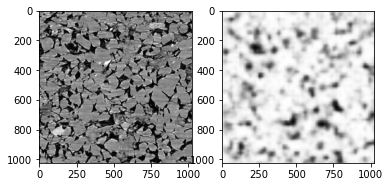

2200it [02:45, 13.27it/s]


Epoch #1: Loss 105528.4296875, Rec-Loss 98755.8515625, KL-Loss 6772.50830078125, Test loss 102300.9140625


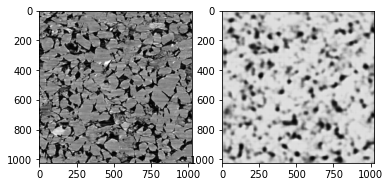

2200it [02:46, 13.24it/s]


Epoch #2: Loss 97101.28125, Rec-Loss 87658.3359375, KL-Loss 9443.0107421875, Test loss 93956.0390625


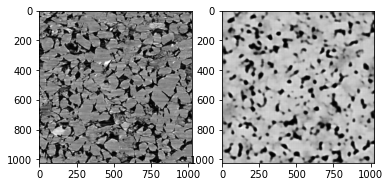

2200it [02:46, 13.24it/s]


Epoch #3: Loss 92188.6171875, Rec-Loss 81876.375, KL-Loss 10312.302734375, Test loss 91322.3984375


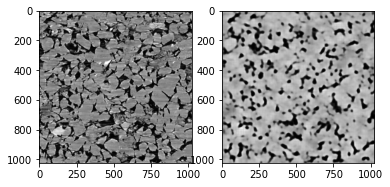

2200it [02:46, 13.24it/s]


Epoch #4: Loss 90105.6328125, Rec-Loss 79096.0, KL-Loss 11009.8134765625, Test loss 89472.609375


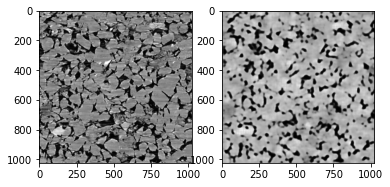

2200it [02:46, 13.24it/s]


Epoch #5: Loss 88624.9453125, Rec-Loss 77076.9296875, KL-Loss 11547.9501953125, Test loss 88286.8203125


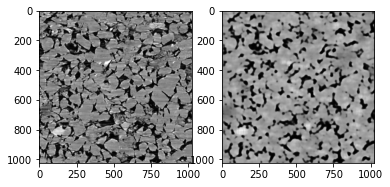

2200it [02:46, 13.24it/s]


Epoch #6: Loss 87567.6796875, Rec-Loss 75576.984375, KL-Loss 11990.6318359375, Test loss 87378.625


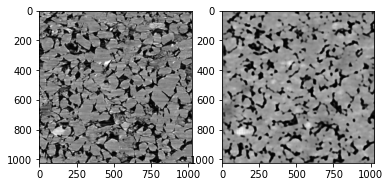

2200it [02:46, 13.25it/s]


Epoch #7: Loss 86757.8984375, Rec-Loss 74412.59375, KL-Loss 12345.375, Test loss 86775.5


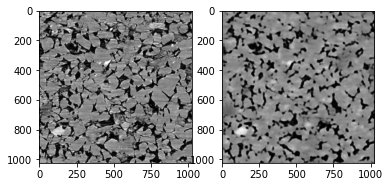

2200it [02:46, 13.25it/s]


Epoch #8: Loss 86079.0, Rec-Loss 73449.8046875, KL-Loss 12629.279296875, Test loss 86069.8984375


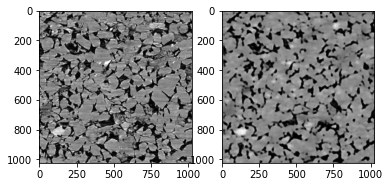

2200it [02:46, 13.24it/s]


Epoch #9: Loss 85515.84375, Rec-Loss 72644.5703125, KL-Loss 12871.3544921875, Test loss 85504.46875


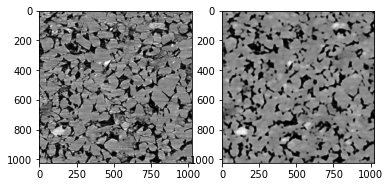

2200it [02:46, 13.25it/s]


Epoch #10: Loss 85020.7109375, Rec-Loss 71938.921875, KL-Loss 13081.8701171875, Test loss 85048.0


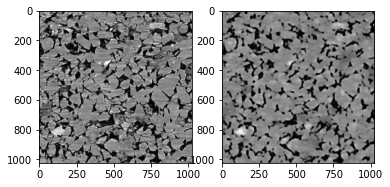

2200it [02:45, 13.26it/s]


Epoch #11: Loss 84587.0, Rec-Loss 71323.25, KL-Loss 13263.607421875, Test loss 84645.4609375


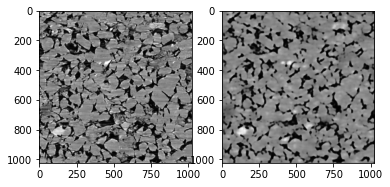

135it [00:10, 13.16it/s]


KeyboardInterrupt: 

In [18]:
train(100, 1, 1)

2200it [02:39, 13.83it/s]


Epoch #0: Loss 25828.32421875, Rec-Loss 25561.3828125, KL-Loss 266.9707946777344, Test loss 25575.001953125


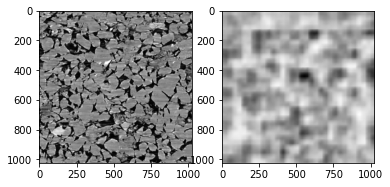

2200it [02:38, 13.88it/s]


Epoch #1: Loss 25028.751953125, Rec-Loss 24642.52734375, KL-Loss 386.2491760253906, Test loss 24728.125


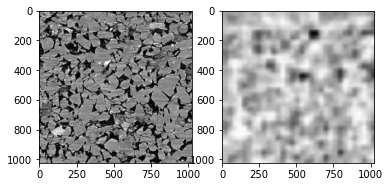

2200it [02:38, 13.85it/s]


Epoch #2: Loss 24116.16015625, Rec-Loss 23638.73046875, KL-Loss 477.4559020996094, Test loss 23898.216796875


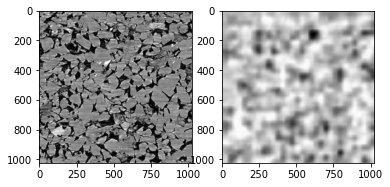

2200it [02:38, 13.85it/s]


Epoch #3: Loss 23292.9609375, Rec-Loss 22763.64453125, KL-Loss 529.3270263671875, Test loss 23177.34375


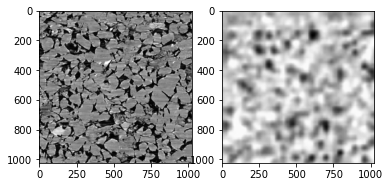

2200it [02:38, 13.85it/s]


Epoch #4: Loss 22589.029296875, Rec-Loss 22025.849609375, KL-Loss 563.2015991210938, Test loss 22543.580078125


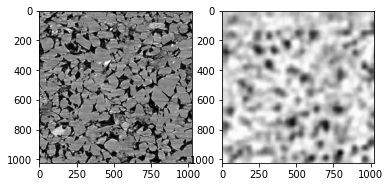

2200it [02:38, 13.85it/s]


Epoch #5: Loss 21966.75390625, Rec-Loss 21381.802734375, KL-Loss 584.96826171875, Test loss 21982.5390625


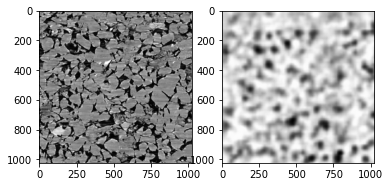

2200it [02:38, 13.84it/s]


Epoch #6: Loss 21374.61328125, Rec-Loss 20772.71484375, KL-Loss 601.8856201171875, Test loss 21455.7421875


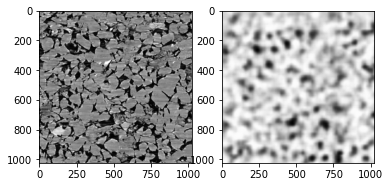

2200it [02:39, 13.84it/s]


Epoch #7: Loss 20823.380859375, Rec-Loss 20207.46484375, KL-Loss 615.9176025390625, Test loss 20914.626953125


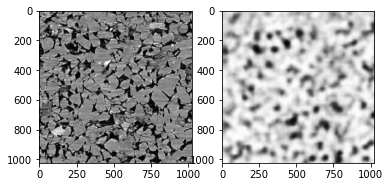

2200it [02:39, 13.83it/s]


Epoch #8: Loss 20322.931640625, Rec-Loss 19695.380859375, KL-Loss 627.5447387695312, Test loss 20516.9375


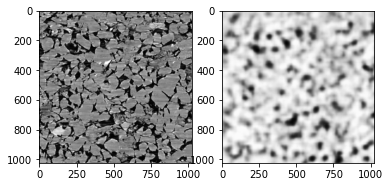

2200it [02:39, 13.83it/s]


Epoch #9: Loss 19855.7421875, Rec-Loss 19216.353515625, KL-Loss 639.3707885742188, Test loss 20065.380859375


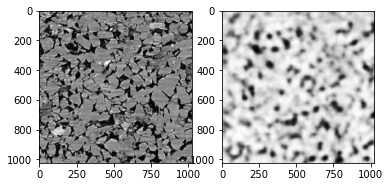

2200it [02:39, 13.83it/s]


Epoch #10: Loss 19431.482421875, Rec-Loss 18779.49609375, KL-Loss 652.0299072265625, Test loss 19691.119140625


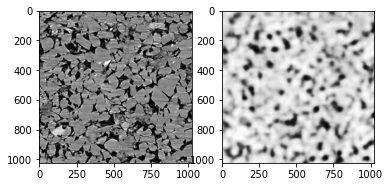

2200it [02:39, 13.83it/s]


Epoch #11: Loss 19037.388671875, Rec-Loss 18375.86328125, KL-Loss 661.5091552734375, Test loss 19356.111328125


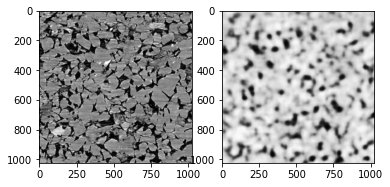

2200it [02:39, 13.83it/s]


Epoch #12: Loss 18675.109375, Rec-Loss 18004.248046875, KL-Loss 670.8519897460938, Test loss 19054.884765625


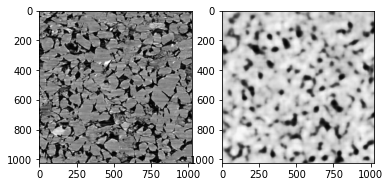

2200it [02:39, 13.83it/s]


Epoch #13: Loss 18340.748046875, Rec-Loss 17661.8125, KL-Loss 678.930419921875, Test loss 18715.271484375


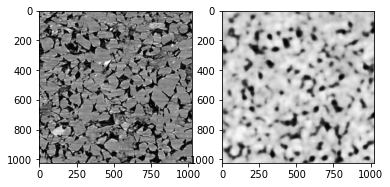

2200it [02:39, 13.83it/s]


Epoch #14: Loss 18035.244140625, Rec-Loss 17348.390625, KL-Loss 686.8441162109375, Test loss 18442.623046875


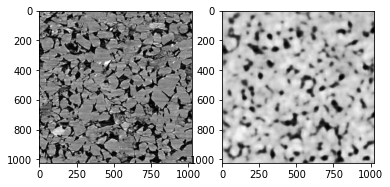

2200it [02:39, 13.83it/s]


Epoch #15: Loss 17746.841796875, Rec-Loss 17052.994140625, KL-Loss 693.8619995117188, Test loss 18201.466796875


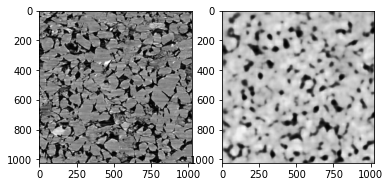

2200it [02:39, 13.83it/s]


Epoch #16: Loss 17482.359375, Rec-Loss 16782.998046875, KL-Loss 699.3866577148438, Test loss 17988.361328125


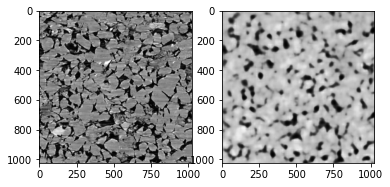

2200it [02:39, 13.83it/s]


Epoch #17: Loss 17224.57421875, Rec-Loss 16519.087890625, KL-Loss 705.4937133789062, Test loss 17753.6796875


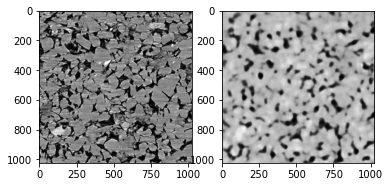

2200it [02:39, 13.83it/s]


Epoch #18: Loss 16993.73046875, Rec-Loss 16284.078125, KL-Loss 709.6530151367188, Test loss 17514.125


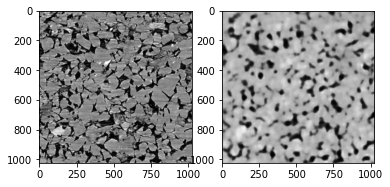

2200it [02:39, 13.83it/s]


Epoch #19: Loss 16762.583984375, Rec-Loss 16048.205078125, KL-Loss 714.3759155273438, Test loss 17310.765625


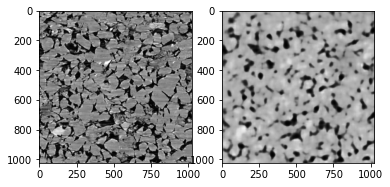

2200it [02:39, 13.83it/s]


Epoch #20: Loss 16553.271484375, Rec-Loss 15834.572265625, KL-Loss 718.6729125976562, Test loss 17120.970703125


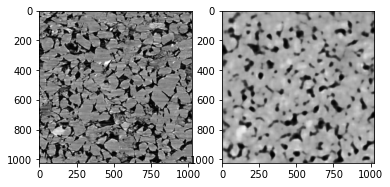

2200it [02:38, 13.84it/s]


Epoch #21: Loss 16351.572265625, Rec-Loss 15629.0546875, KL-Loss 722.5320434570312, Test loss 16949.48828125


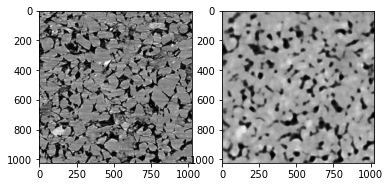

2200it [02:38, 13.84it/s]


Epoch #22: Loss 16158.8349609375, Rec-Loss 15433.0869140625, KL-Loss 725.7449951171875, Test loss 16762.603515625


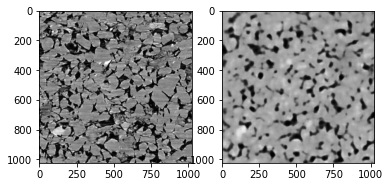

2200it [02:39, 13.83it/s]


Epoch #23: Loss 15974.2802734375, Rec-Loss 15244.890625, KL-Loss 729.38037109375, Test loss 16623.171875


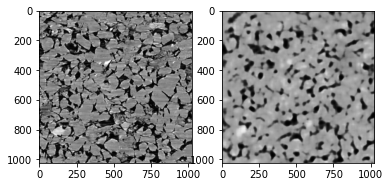

2200it [02:39, 13.83it/s]


Epoch #24: Loss 15800.1396484375, Rec-Loss 15067.3515625, KL-Loss 732.7594604492188, Test loss 16571.8984375


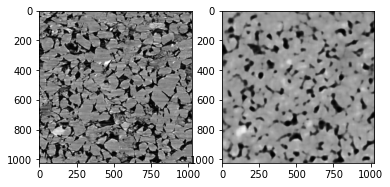

2200it [02:39, 13.83it/s]


Epoch #25: Loss 15635.5947265625, Rec-Loss 14900.36328125, KL-Loss 735.2451782226562, Test loss 16298.76953125


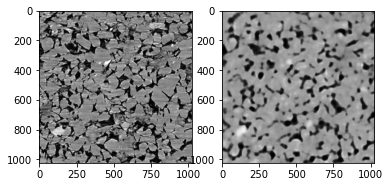

2200it [02:39, 13.83it/s]


Epoch #26: Loss 15474.6162109375, Rec-Loss 14736.587890625, KL-Loss 738.0206298828125, Test loss 16149.5546875


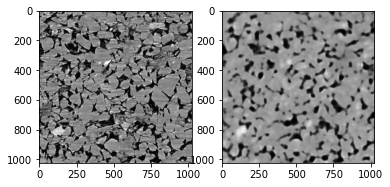

2200it [02:39, 13.83it/s]


Epoch #27: Loss 15328.05078125, Rec-Loss 14587.2451171875, KL-Loss 740.8128662109375, Test loss 16000.1396484375


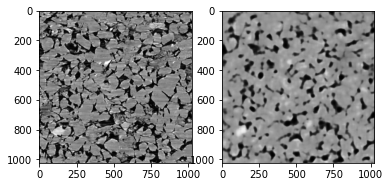

2200it [02:39, 13.83it/s]


Epoch #28: Loss 15183.4814453125, Rec-Loss 14440.4931640625, KL-Loss 743.0031127929688, Test loss 15923.158203125


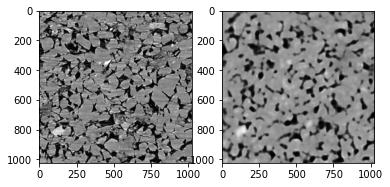

2200it [02:39, 13.83it/s]


Epoch #29: Loss 15049.802734375, Rec-Loss 14304.81640625, KL-Loss 744.986572265625, Test loss 15740.28515625


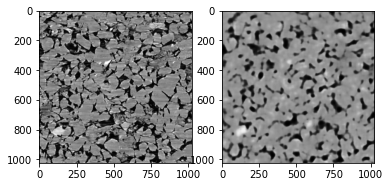

2200it [02:38, 13.85it/s]


Epoch #30: Loss 14913.9765625, Rec-Loss 14166.162109375, KL-Loss 747.816162109375, Test loss 15621.6162109375


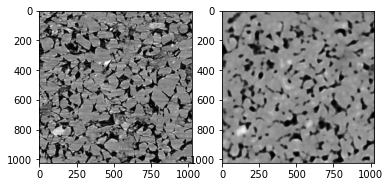

2200it [02:38, 13.85it/s]


Epoch #31: Loss 14794.203125, Rec-Loss 14045.310546875, KL-Loss 748.9208984375, Test loss 15489.4033203125


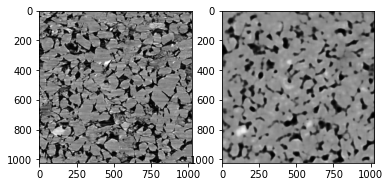

2200it [02:38, 13.86it/s]


Epoch #32: Loss 14676.4208984375, Rec-Loss 13925.5478515625, KL-Loss 750.8877563476562, Test loss 15453.96875


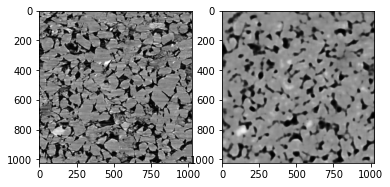

2200it [02:38, 13.87it/s]


Epoch #33: Loss 14559.359375, Rec-Loss 13806.9697265625, KL-Loss 752.3988647460938, Test loss 15278.208984375


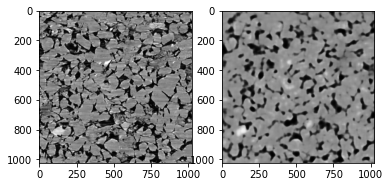

2200it [02:38, 13.86it/s]


Epoch #34: Loss 14445.91015625, Rec-Loss 13691.1669921875, KL-Loss 754.732421875, Test loss 15184.0859375


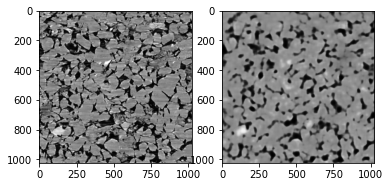

2200it [02:38, 13.87it/s]


Epoch #35: Loss 14336.7333984375, Rec-Loss 13579.955078125, KL-Loss 756.7841186523438, Test loss 15085.6865234375


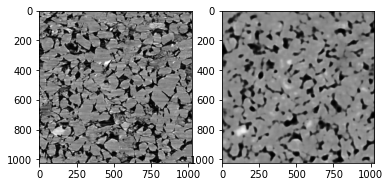

2200it [02:38, 13.85it/s]


Epoch #36: Loss 14235.908203125, Rec-Loss 13477.431640625, KL-Loss 758.4696655273438, Test loss 15036.255859375


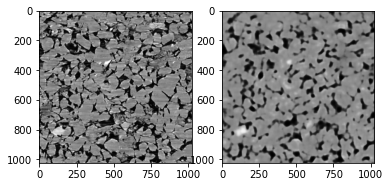

2200it [02:38, 13.84it/s]


Epoch #37: Loss 14140.3759765625, Rec-Loss 13380.9853515625, KL-Loss 759.3968505859375, Test loss 14894.42578125


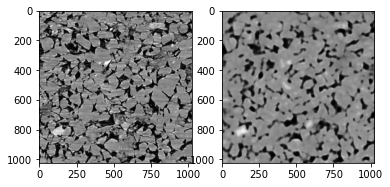

2200it [02:38, 13.84it/s]


Epoch #38: Loss 14036.92578125, Rec-Loss 13276.0234375, KL-Loss 760.8936157226562, Test loss 14807.29296875


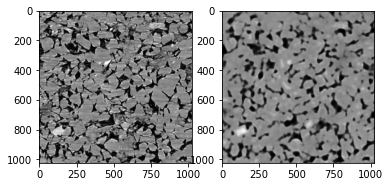

2200it [02:39, 13.83it/s]


Epoch #39: Loss 13955.220703125, Rec-Loss 13192.9853515625, KL-Loss 762.20166015625, Test loss 14754.861328125


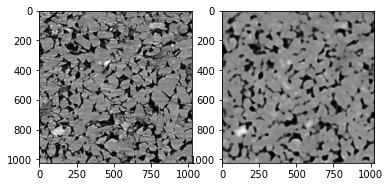

2200it [02:39, 13.83it/s]


Epoch #40: Loss 13863.185546875, Rec-Loss 13099.939453125, KL-Loss 763.243896484375, Test loss 14666.0


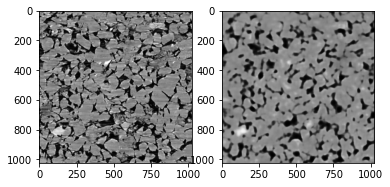

2200it [02:39, 13.83it/s]


Epoch #41: Loss 13778.48046875, Rec-Loss 13013.328125, KL-Loss 765.1516723632812, Test loss 14569.89453125


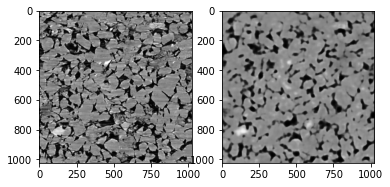

2200it [02:39, 13.83it/s]


Epoch #42: Loss 13699.609375, Rec-Loss 12933.8818359375, KL-Loss 765.7314453125, Test loss 14520.9140625


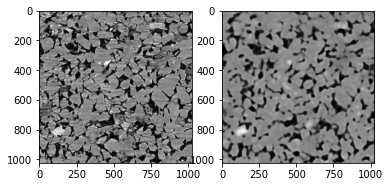

2200it [02:39, 13.83it/s]


Epoch #43: Loss 13612.7431640625, Rec-Loss 12845.6240234375, KL-Loss 767.1156616210938, Test loss 14415.640625


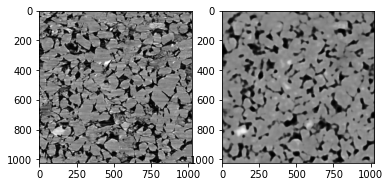

2200it [02:39, 13.83it/s]


Epoch #44: Loss 13540.40625, Rec-Loss 12771.3681640625, KL-Loss 769.0531005859375, Test loss 14360.75390625


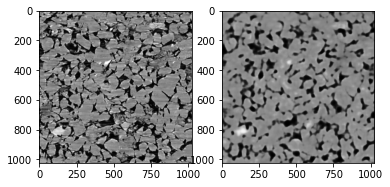

2200it [02:39, 13.83it/s]


Epoch #45: Loss 13464.7685546875, Rec-Loss 12694.9541015625, KL-Loss 769.7932739257812, Test loss 14274.40625


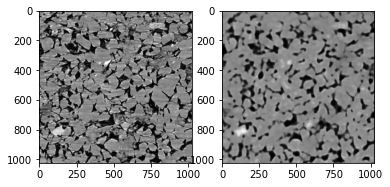

2200it [02:39, 13.83it/s]


Epoch #46: Loss 13391.0595703125, Rec-Loss 12620.455078125, KL-Loss 770.5926513671875, Test loss 14207.5849609375


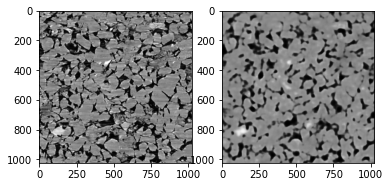

2200it [02:39, 13.83it/s]


Epoch #47: Loss 13324.3134765625, Rec-Loss 12552.5283203125, KL-Loss 771.7852783203125, Test loss 14164.9033203125


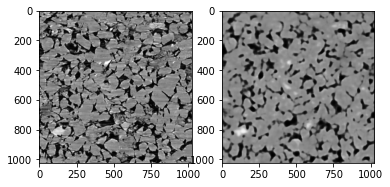

2200it [02:39, 13.83it/s]


Epoch #48: Loss 13255.26171875, Rec-Loss 12482.2578125, KL-Loss 773.0256958007812, Test loss 14085.3515625


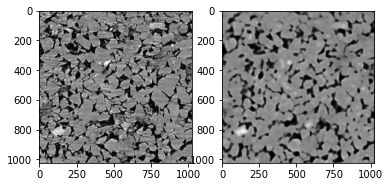

2200it [02:39, 13.83it/s]


Epoch #49: Loss 13190.849609375, Rec-Loss 12416.841796875, KL-Loss 774.0171508789062, Test loss 14025.1513671875


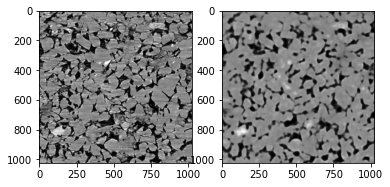

2200it [02:39, 13.83it/s]


Epoch #50: Loss 13123.5380859375, Rec-Loss 12348.576171875, KL-Loss 774.9797973632812, Test loss 13968.1943359375


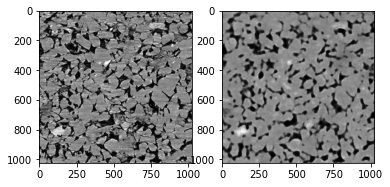

2200it [02:39, 13.83it/s]


Epoch #51: Loss 13060.3271484375, Rec-Loss 12284.7099609375, KL-Loss 775.6237182617188, Test loss 13920.861328125


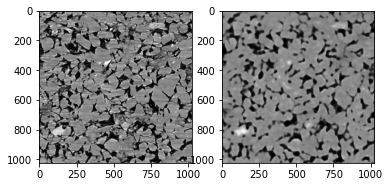

2200it [02:39, 13.83it/s]


Epoch #52: Loss 12999.5869140625, Rec-Loss 12223.126953125, KL-Loss 776.4790649414062, Test loss 13838.4013671875


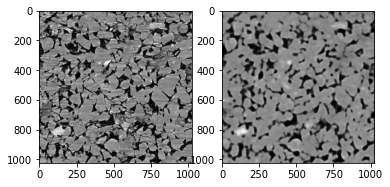

2200it [02:39, 13.83it/s]


Epoch #53: Loss 12934.32421875, Rec-Loss 12156.666015625, KL-Loss 777.63427734375, Test loss 13818.373046875


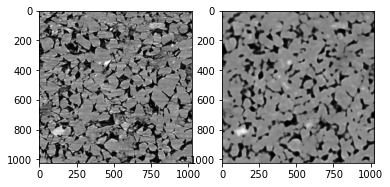

2200it [02:39, 13.83it/s]


Epoch #54: Loss 12880.41015625, Rec-Loss 12101.453125, KL-Loss 778.9520263671875, Test loss 13746.146484375


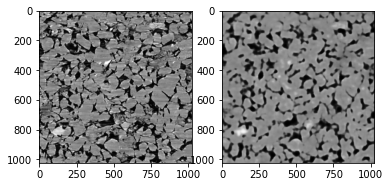

2200it [02:39, 13.83it/s]


Epoch #55: Loss 12834.033203125, Rec-Loss 12055.00390625, KL-Loss 779.0211181640625, Test loss 13660.498046875


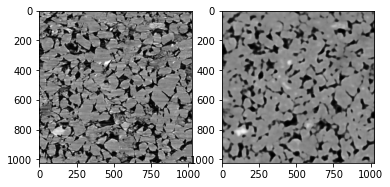

2200it [02:39, 13.83it/s]


Epoch #56: Loss 12765.8603515625, Rec-Loss 11985.302734375, KL-Loss 780.5531005859375, Test loss 13647.1630859375


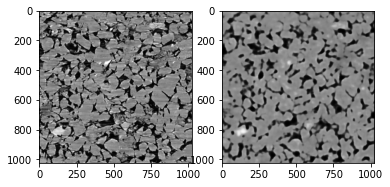

2200it [02:39, 13.83it/s]


Epoch #57: Loss 12720.4326171875, Rec-Loss 11939.373046875, KL-Loss 781.066650390625, Test loss 13599.439453125


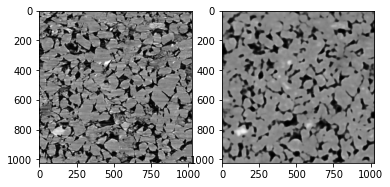

2200it [02:39, 13.83it/s]


Epoch #58: Loss 12666.2890625, Rec-Loss 11883.63671875, KL-Loss 782.6307373046875, Test loss 13574.3427734375


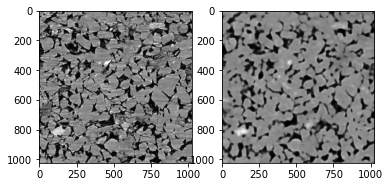

2200it [02:39, 13.83it/s]


Epoch #59: Loss 12616.90625, Rec-Loss 11834.3857421875, KL-Loss 782.5256958007812, Test loss 13485.3095703125


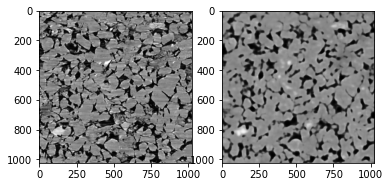

2200it [02:39, 13.83it/s]


Epoch #60: Loss 12561.5126953125, Rec-Loss 11778.072265625, KL-Loss 783.4365844726562, Test loss 13422.1484375


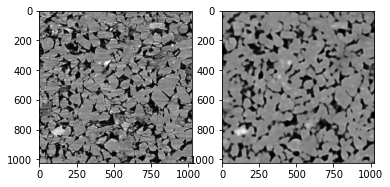

2200it [02:39, 13.83it/s]


Epoch #61: Loss 12521.3828125, Rec-Loss 11737.1162109375, KL-Loss 784.2657470703125, Test loss 13400.998046875


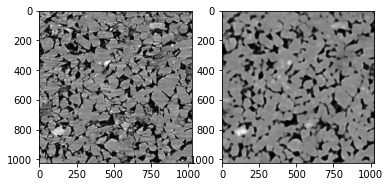

2200it [02:39, 13.83it/s]


Epoch #62: Loss 12464.017578125, Rec-Loss 11678.9208984375, KL-Loss 785.0975341796875, Test loss 13377.8291015625


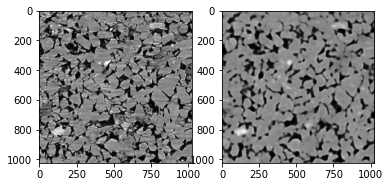

2200it [02:39, 13.83it/s]


Epoch #63: Loss 12427.2919921875, Rec-Loss 11641.435546875, KL-Loss 785.8583374023438, Test loss 13303.9609375


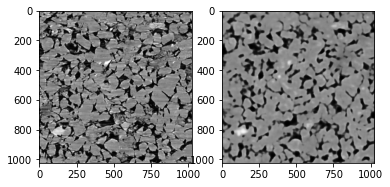

2200it [02:39, 13.83it/s]


Epoch #64: Loss 12381.216796875, Rec-Loss 11594.8427734375, KL-Loss 786.3696899414062, Test loss 13317.7490234375


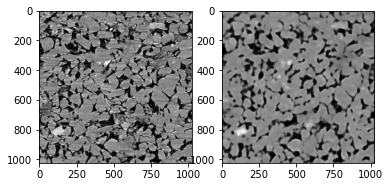

337it [00:24, 13.77it/s]


KeyboardInterrupt: 

In [17]:
train(100, 10, 1)

In [18]:
encoder.save_weights(f'./core_plugs/models_vae_250_tt/encoder_epoch_74.ckpt')
decoder.save_weights(f'./core_plugs/models_vae_250_tt/decoder_epoch_74.ckpt')

In [6]:
encoder.load_weights(f'./core_plugs/models_vae_250_tt/encoder_epoch_74.ckpt')
decoder.load_weights(f'./core_plugs/models_vae_250_tt/decoder_epoch_74.ckpt')

In [19]:
def im_to_pil(im):
    im = im.numpy()*255
    im = im.astype(np.uint8)
    return Image.fromarray(im)

In [29]:
for x in train_dataset.take(1):
    z_mean, z_log_var, z = encoder(x)
    reconstruction = decoder(z_mean)

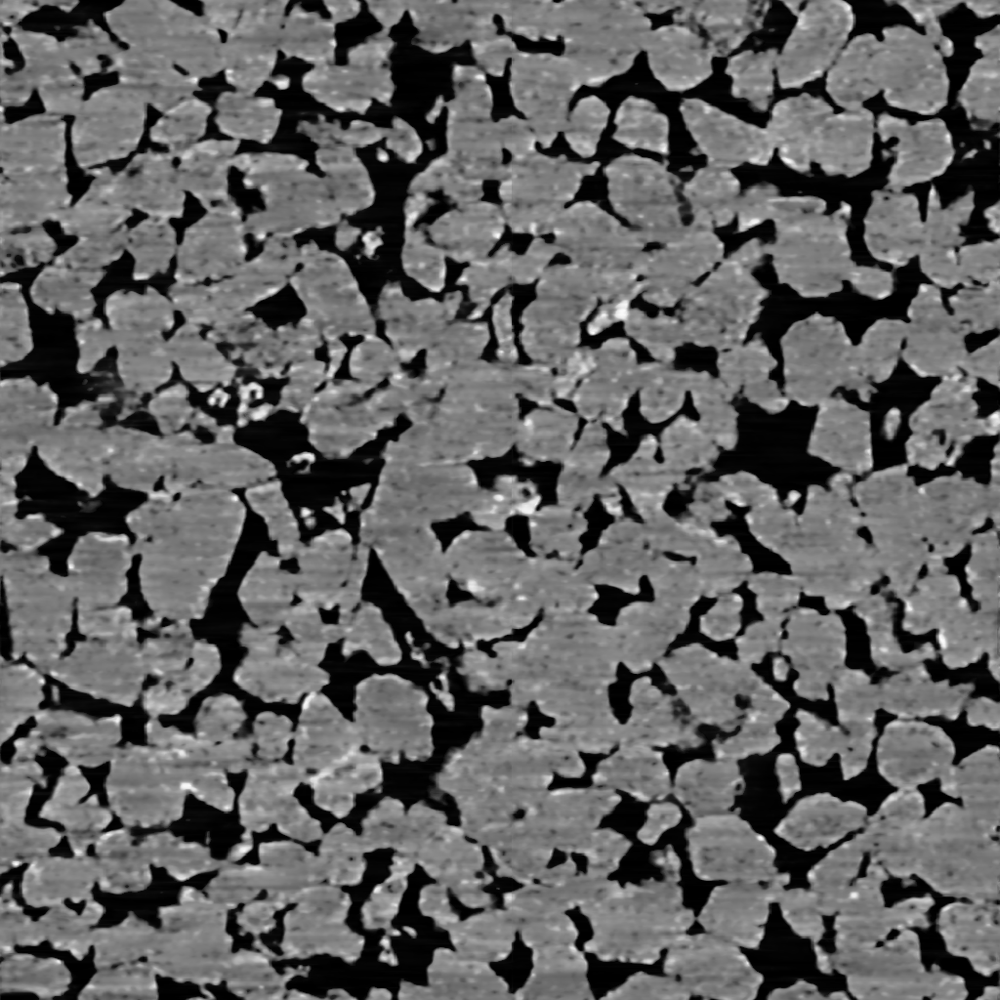

In [30]:
im_to_pil(x[0,:,:,0])

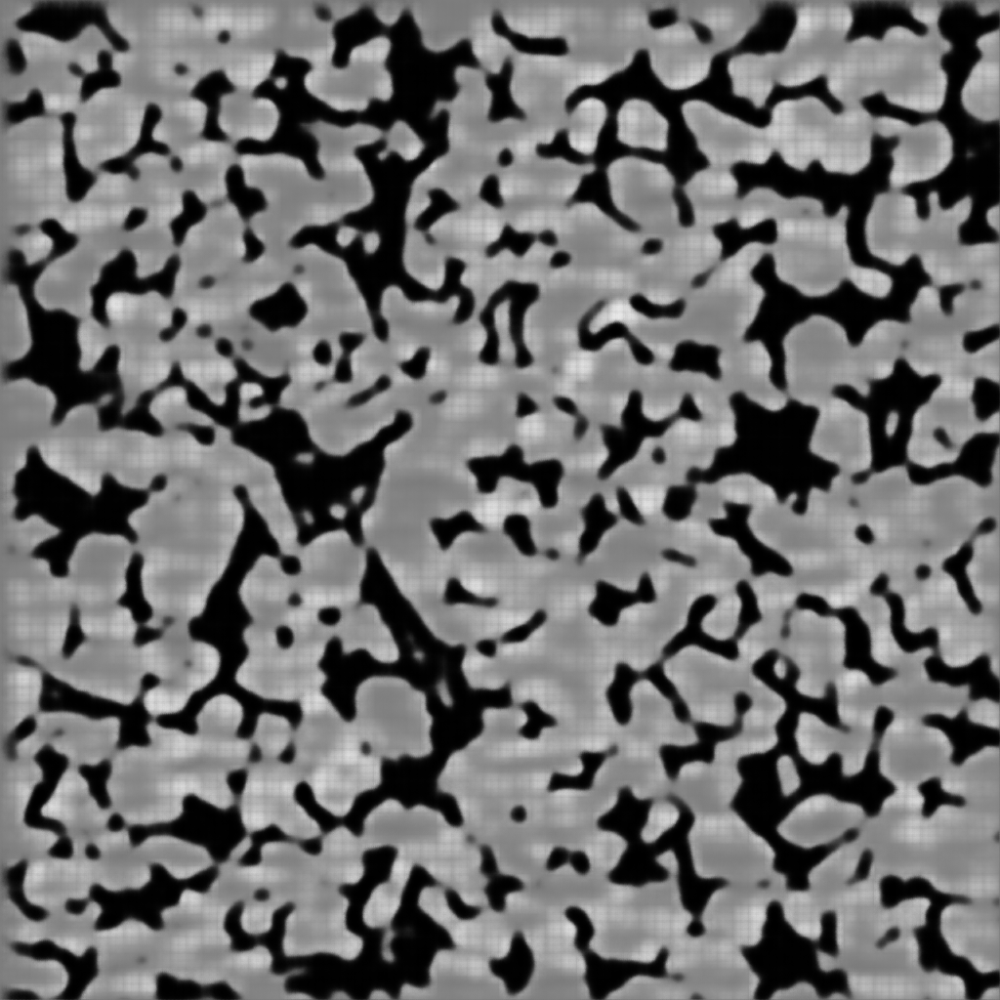

In [31]:
im_to_pil(reconstruction[0,:,:,0])

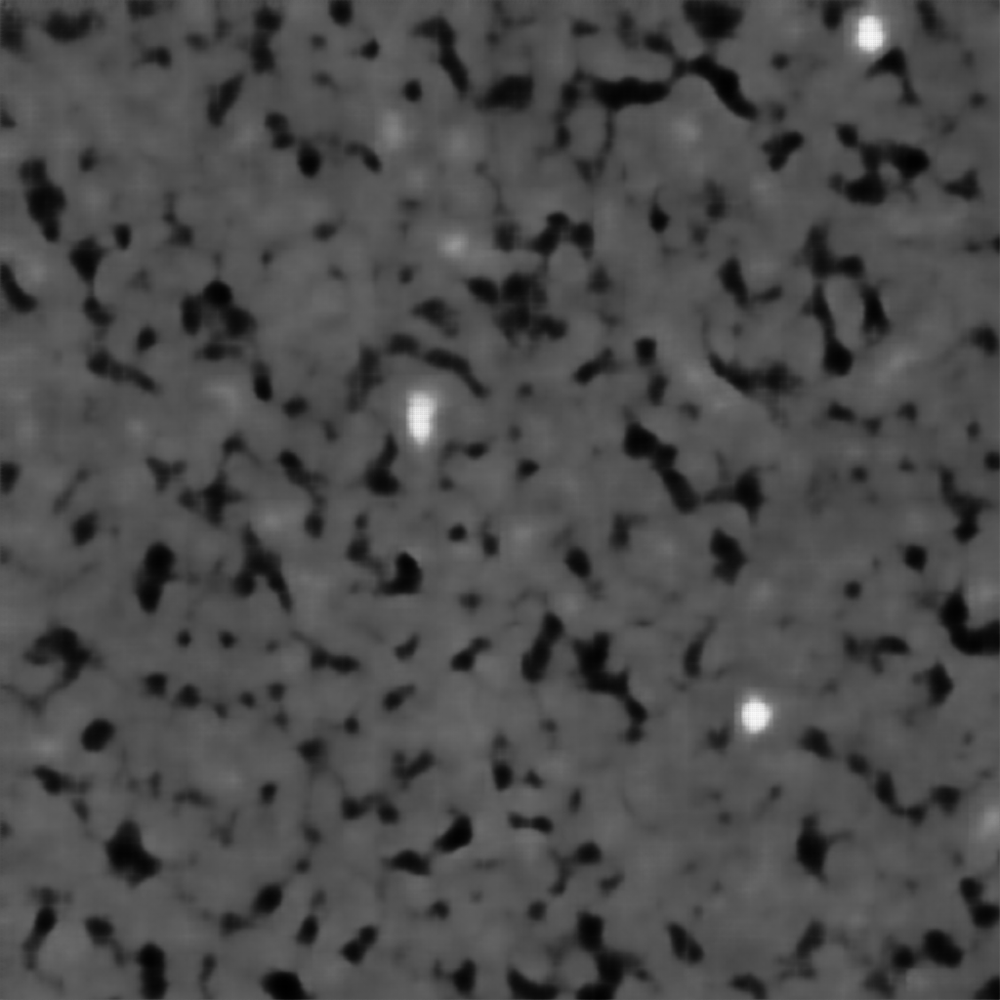

In [51]:
im_to_pil(reconstruction[0,:,:,0])#.resize((1024//4,1024//4))

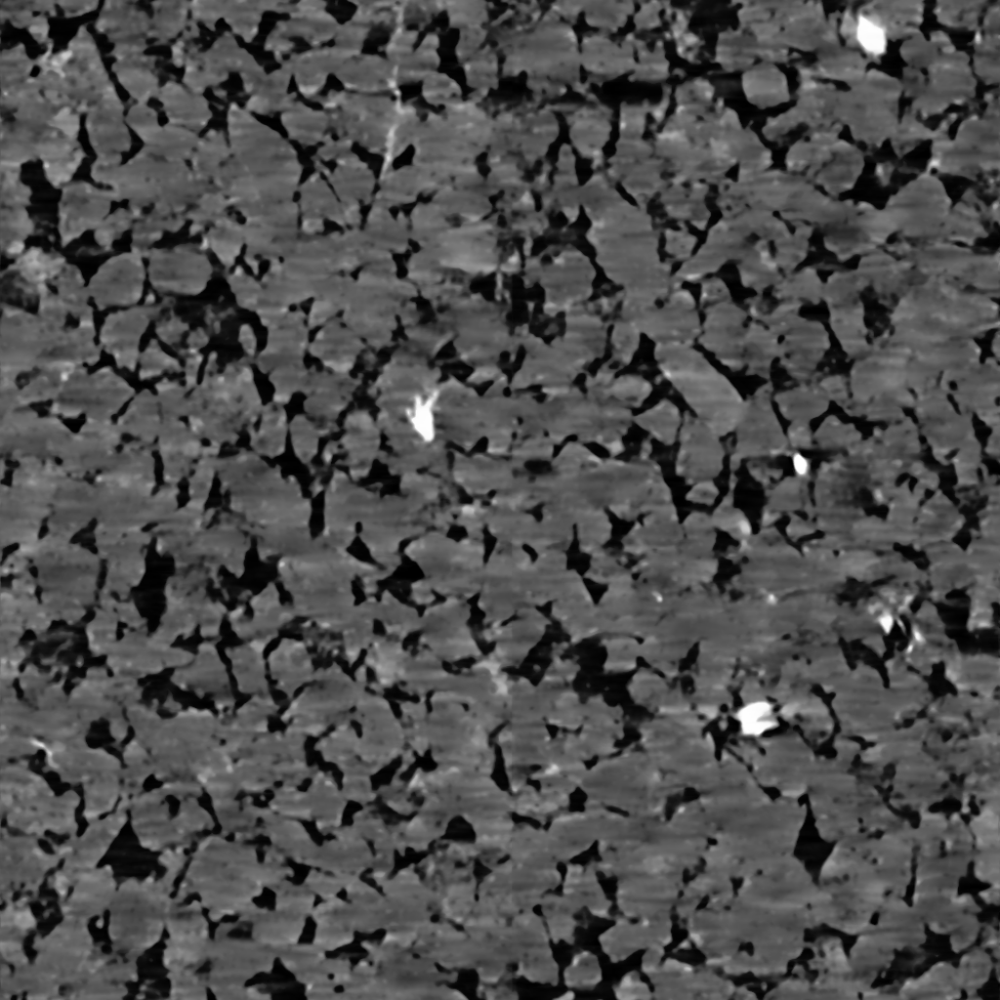

In [54]:
Image.open('test_slice.png').convert('L')

In [49]:
test_slice = np.expand_dims(np.array(Image.open('test_slice.png').convert('L')) / 255.0, 0)

In [50]:
z_mean, z_log_var, z = encoder(test_slice)
reconstruction = decoder(z)

In [33]:
from model.edsr import edsr

In [40]:
depth = 16
scale = 4
downgrade = 'bicubic'

#weights_dir = f'sr/weights/edsr-{depth}-x{scale}'
#weights_file = os.path.join(weights_dir, 'weights.h5')

#os.makedirs(weights_dir, exist_ok = True)

model_sr = edsr(
    scale=scale, num_res_blocks=depth, target_h = 1024,
    target_w = 1024, channels = 1)

#model_sr.load_weights('weights.h5')

In [41]:
model_sr.summary()

Model: "edsr"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
lambda_12 (Lambda)              (None, None, None, 1 0           input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_201 (Conv2D)             (None, None, None, 6 640         lambda_12[0][0]                  
__________________________________________________________________________________________________
conv2d_202 (Conv2D)             (None, None, None, 6 36928       conv2d_201[0][0]                 
_______________________________________________________________________________________________

In [42]:
# def im_scale(im):
#     return im
#     #return (im-0.5)*2

# def im_descale(im):
#     return im
#     #return im/2 + 0.5

def psnr(x1, x2):
    return tf.image.psnr(x1, x2, max_val=1)

def train_sr(epochs, lr = 1e-5):
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    
    train_mean_loss = tf.keras.metrics.Mean()
    test_mean_loss = tf.keras.metrics.Mean()
    
    train_mean_psnr = tf.keras.metrics.Mean()
    test_mean_psnr = tf.keras.metrics.Mean()
    
    def calc_loss(y_true, y_pred):
        return tf.reduce_mean(tf.math.abs(y_true - y_pred))
    
    @tf.function
    def compute_loss_and_grads(x,y):
        #x = im_scale(x)
        #y = im_scale(y)
        with tf.GradientTape() as tape:
            tape.watch(model_sr.trainable_variables)
            y_pred = model_sr(x)
            loss = calc_loss(y, y_pred)
        grads = tape.gradient(loss, model_sr.trainable_variables)
        
        return loss, grads, y_pred
    
    for epoch in range(epochs):
        for x,y in tqdm(slicerec_dataset):
            x = tf.image.resize(x, [x.shape[1] // 4, x.shape[2] // 4])
            #print(x.shape, y.shape)
            loss, grads, y_pred = compute_loss_and_grads(x,y)
            optimizer.apply_gradients(zip(grads, model_sr.trainable_variables))
            train_mean_loss(loss)
            train_mean_psnr(psnr(y,y_pred))
            
        # for x,y in test_dataset.take(2):
        #     x_n = im_scale(x)
        #     y_n = im_scale(y)
        #     y_pred = model_sr(x_n)
        #     loss = calc_loss(y_n,y_pred)
        #     test_mean_loss(loss)
        #     test_mean_psnr(psnr(y,im_descale(y_pred)))
        
        if epoch % 1 == 0:
            print(
                'Epoch #', str(epoch),
                '; Loss = ', train_mean_loss.result().numpy(),
                '; PSNR = ', train_mean_psnr.result().numpy(),
                '; Test Loss = ', test_mean_loss.result().numpy(),
                '; Test PSNR = ', test_mean_psnr.result().numpy()
            )
            
            fig = plt.figure(figsize=(14,14))
            fig.add_subplot(1,3,1)
            plt.imshow(x[0])
            fig.add_subplot(1,3,2)
            plt.imshow(y[0])
            fig.add_subplot(1,3,3)
            plt.imshow(y_pred[0])
            plt.show()
        
        train_mean_loss.reset_state()
        test_mean_loss.reset_state()
        train_mean_psnr.reset_state()
        test_mean_psnr.reset_state()

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 0 ; Loss =  0.07352442 ; PSNR =  19.641165 ; Test Loss =  0.0 ; Test PSNR =  0.0


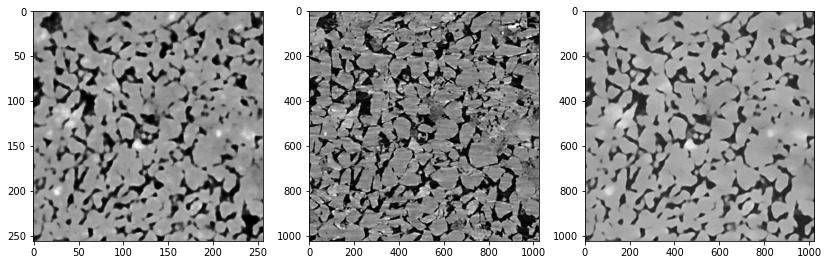

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 1 ; Loss =  0.070939764 ; PSNR =  19.785065 ; Test Loss =  0.0 ; Test PSNR =  0.0


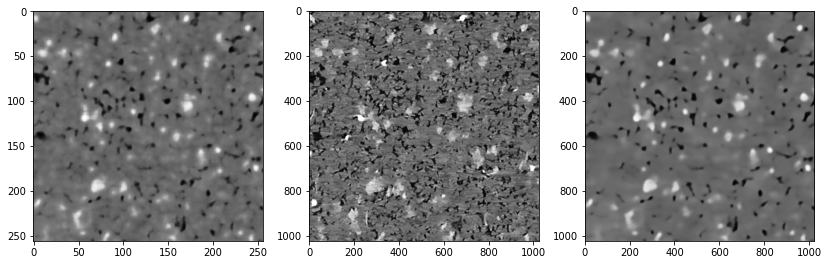

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 2 ; Loss =  0.07061722 ; PSNR =  19.785633 ; Test Loss =  0.0 ; Test PSNR =  0.0


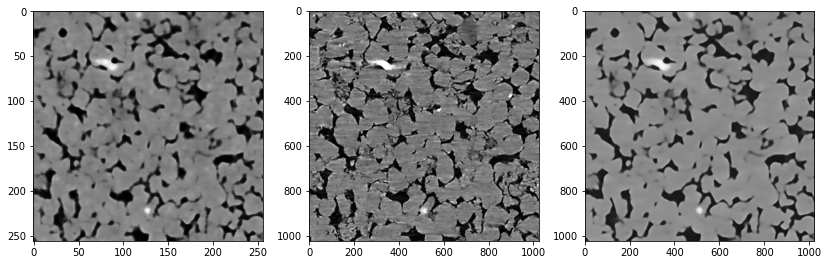

100%|███████████████████████████████████████| 1100/1100 [08:07<00:00,  2.25it/s]


Epoch # 3 ; Loss =  0.070449814 ; PSNR =  19.786642 ; Test Loss =  0.0 ; Test PSNR =  0.0


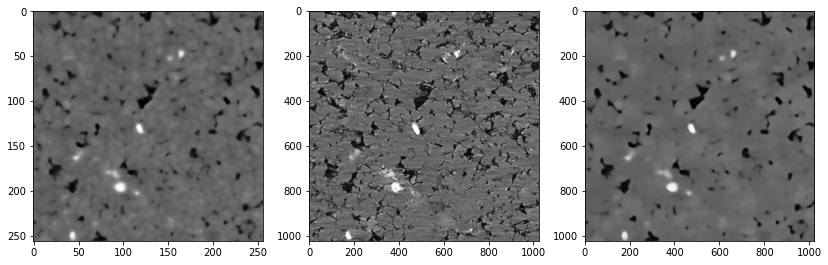

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 4 ; Loss =  0.07035944 ; PSNR =  19.786861 ; Test Loss =  0.0 ; Test PSNR =  0.0


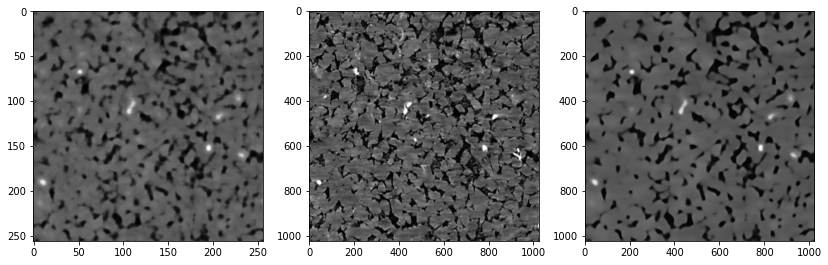

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 5 ; Loss =  0.07024698 ; PSNR =  19.788918 ; Test Loss =  0.0 ; Test PSNR =  0.0


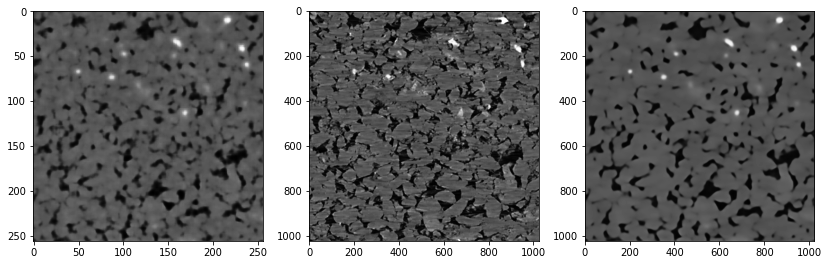

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 6 ; Loss =  0.070181385 ; PSNR =  19.790442 ; Test Loss =  0.0 ; Test PSNR =  0.0


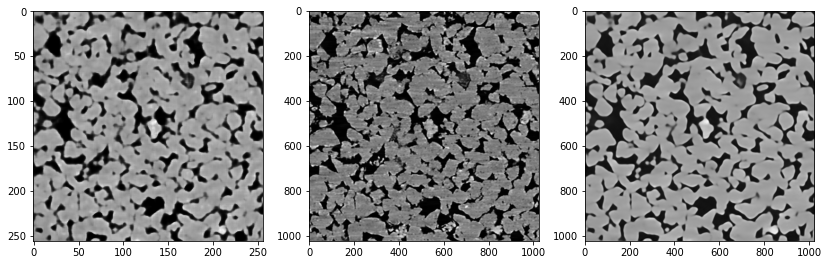

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 7 ; Loss =  0.07010004 ; PSNR =  19.791761 ; Test Loss =  0.0 ; Test PSNR =  0.0


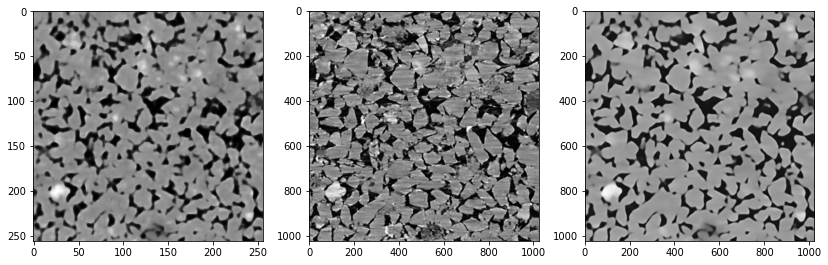

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 8 ; Loss =  0.070047595 ; PSNR =  19.793137 ; Test Loss =  0.0 ; Test PSNR =  0.0


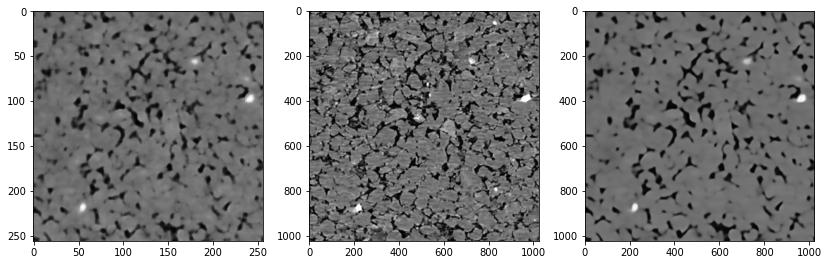

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 9 ; Loss =  0.069994844 ; PSNR =  19.79469 ; Test Loss =  0.0 ; Test PSNR =  0.0


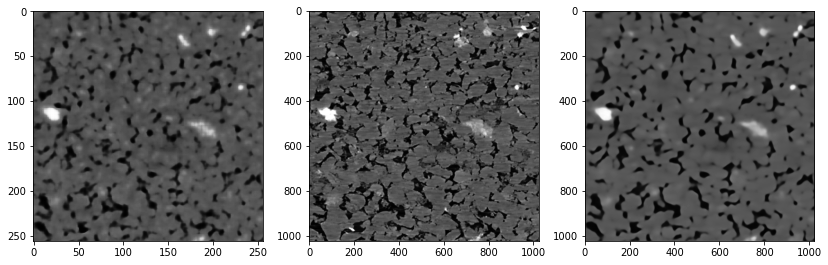

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 10 ; Loss =  0.06993677 ; PSNR =  19.796177 ; Test Loss =  0.0 ; Test PSNR =  0.0


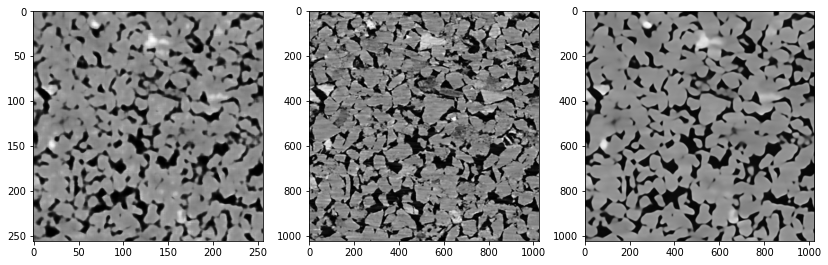

100%|███████████████████████████████████████| 1100/1100 [08:08<00:00,  2.25it/s]


Epoch # 11 ; Loss =  0.069900244 ; PSNR =  19.797977 ; Test Loss =  0.0 ; Test PSNR =  0.0


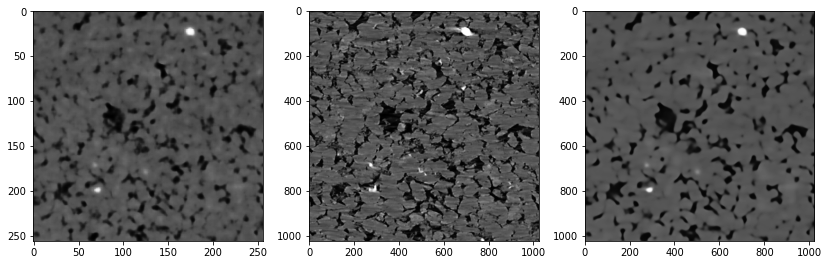

  1%|▌                                        | 16/1100 [00:07<08:38,  2.09it/s]


KeyboardInterrupt: 

In [43]:
train_sr(1000, lr=1e-4)

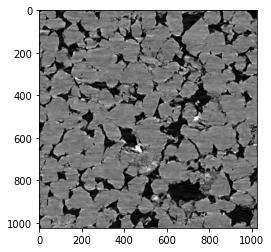

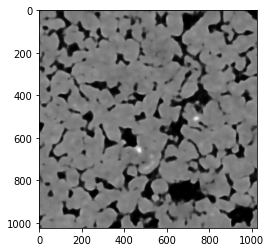

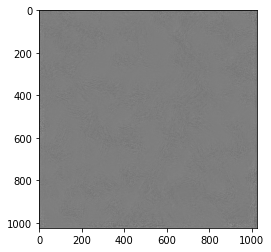

tf.Tensor(
[[[-9.4774759e-01]
  [-5.7269931e-03]
  [-2.7436525e-01]
  ...
  [ 5.9657907e-01]
  [ 2.0780146e+00]
  [ 2.4625790e-01]]

 [[ 1.6143217e+00]
  [ 4.8499200e-01]
  [ 1.9122535e+00]
  ...
  [-1.6085584e+00]
  [ 1.9383225e+00]
  [ 1.2934854e+00]]

 [[ 1.7458460e+00]
  [ 1.9781504e+00]
  [-7.3720706e-01]
  ...
  [ 1.0722971e+00]
  [ 2.2900214e+00]
  [ 5.8676124e+00]]

 ...

 [[ 6.8612909e-01]
  [-1.5948875e+00]
  [ 2.2348660e-01]
  ...
  [ 2.5843775e+00]
  [-1.8518105e+00]
  [ 1.6285549e+00]]

 [[ 6.8808448e-01]
  [ 1.2256260e+00]
  [-4.3366952e+00]
  ...
  [-3.5429935e+00]
  [-1.8728878e+00]
  [ 2.2196719e-01]]

 [[ 9.4183022e-01]
  [ 1.1895695e+00]
  [ 2.7469331e-01]
  ...
  [ 8.7777019e-01]
  [ 5.8450115e-01]
  [-4.0860862e-01]]], shape=(1024, 1024, 1), dtype=float32)


In [30]:
for x in train_dataset.take(1):
    z_mean, z_log_var, z = encoder(x)
    reconstruction = decoder(z)
    x_sr = model_sr(tf.image.resize(reconstruction, [1024 // 4, 1024 // 4]))
    
    plt.imshow(x[0])
    plt.show()
    plt.imshow(reconstruction[0])
    plt.show()
    plt.imshow(x_sr[0])
    plt.show()
    
    print(x_sr[0])

In [13]:
for i, x in tqdm(enumerate(train_dataset.unbatch().batch(1))):
    z_mean, z_log_var, z = encoder(x)
    reconstruction = decoder(z)
    im_to_pil(x[0,:,:,0]).save(f'./data/gray_vae_data/slice/{i:06d}.png')
    im_to_pil(reconstruction[0,:,:,0]).save(f'./data/gray_vae_data/rec/{i:06d}.png')

8800it [25:55,  5.66it/s]


In [14]:
from glob import glob

In [17]:
slices = glob('./data/gray_vae_data/slice/*.png')
recs = glob('./data/gray_vae_data/rec/*.png')

slices.sort()
recs.sort()

In [28]:
slicerec_dataset = tf.data.Dataset.from_tensor_slices((recs, slices)).shuffle(len(slices), reshuffle_each_iteration=True)

In [29]:
def readImage(x):
    x = tf.io.read_file(x)
    x = tf.io.decode_png(x, channels=1)
    x = tf.cast(x, tf.float32) / 255.0
    return x
slicerec_dataset = slicerec_dataset.map(lambda x,y: (readImage(x),readImage(y))).batch(8)

In [31]:
for x,y in slicerec_dataset.take(1):
    print(x.shape, y.shape)

(8, 1024, 1024, 1) (8, 1024, 1024, 1)


In [46]:
x_in = Input(shape=(10,10,1))
x_b = Conv2D(32, 3, padding='same')(x_in)
x = Add()([x_in,x_b])
x = Lambda(lambda x: tf.image.resize(x,[5,5]))(x)
x_b = Conv2D(32, 3, padding='same')(x)
x = Add()([x,x_b])
x = Lambda(lambda x: tf.image.resize(x,[2,2]))(x)

test_m = Model(x_in, x)

test_m.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 10, 10, 1)]  0           []                               
                                                                                                  
 conv2d_9 (Conv2D)              (None, 10, 10, 32)   320         ['input_5[0][0]']                
                                                                                                  
 add_1 (Add)                    (None, 10, 10, 32)   0           ['input_5[0][0]',                
                                                                  'conv2d_9[0][0]']               
                                                                                                  
 lambda_1 (Lambda)              (None, 5, 5, 32)     0           ['add_1[0][0]']              